In [1]:
#!pip install --user sklearn
#!pip install --user  pandas
#!pip install --user matplotlib
#!pip install --user pandas
#!pip install --user yellowbrick
#!pip install sklearn
#!pip install pandas
#!pip install matplotlib
#!pip install pandas
#!pip install yellowbrick
#!pip install psycopg2==2.7.3.2
#!pip install folium

# Carregando bibliotecas

In [26]:
import pandas as pd
import matplotlib
import matplotlib.pyplot as plt
import sklearn as sk
from sklearn import datasets
from sklearn.cluster import KMeans
import seaborn as sns; sns.set()
import psycopg2
from yellowbrick.cluster import KElbowVisualizer
import sqlalchemy as sqlalc
import folium

In [4]:
#conn  =  psycopg2.connect(database= 'Criminalidade',user = 'postgres',password = '123456')
conn  =  psycopg2.connect(host = 'postgres10-crime_sp', database = 'postgres', user = 'postgres', password = 'senha')

## Outra análise


In [5]:
df = pd.read_sql_query("""select dim_local.latitude,dim_local.longitude, 
                            dim_rubrica2.cod_grupo_rubrica
                            from dim_local
                            inner join fato_crime
                            on dim_local.id_dim_local = fato_crime.local
                            inner join dim_rubrica2
                            on fato_crime.rubrica = dim_rubrica2.id_dim_rubrica
                            where latitude < -21 and
                            longitude < 0 and
                            (dim_rubrica2.grupo_rubrica ilike 'homicidio' or
                            dim_rubrica2.grupo_rubrica ilike 'furto');""",conn)

In [6]:
df.groupby(by=['cod_grupo_rubrica']).count()

,latitude,longitude
cod_grupo_rubrica,,
2,14217,14217
3,305522,305522


In [7]:
df10k = df.sample(10000)
df1k = df.sample(1000)

# Longitude x Latitude

In [60]:
df = pd.read_sql_query("""select dim_local.latitude,dim_local.longitude, 
                            dim_rubrica2.cod_grupo_rubrica
                            from dim_local
                            inner join fato_crime
                            on dim_local.id_dim_local = fato_crime.local
                            inner join dim_rubrica2
                            on fato_crime.rubrica = dim_rubrica2.id_dim_rubrica
                            where latitude < -21 and
                            longitude < 0 and
                            (dim_rubrica2.grupo_rubrica ilike 'homicidio' or
                            dim_rubrica2.grupo_rubrica ilike 'roubo')
                            limit 10000;""",conn)

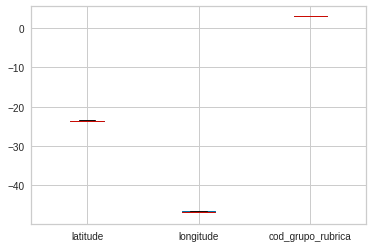

In [132]:
df = df.dropna(axis = 0, how = 'all')
df.boxplot()

In [8]:
df10k.describe()

,latitude,longitude,cod_grupo_rubrica
count,10000.000000,10000.000000,10000.000000
mean,-23.562894,-46.622277,2.954800
std,0.063345,0.088992,0.207753
min,-23.869839,-47.110922,2.000000
25%,-23.594939,-46.683769,3.000000
50%,-23.551512,-46.638587,3.000000
75%,-23.524926,-46.577341,3.000000
max,-22.936265,-46.372634,3.000000


In [9]:
xrm = df10k.loc[:,["longitude","latitude", "cod_grupo_rubrica"]].values

Text(0,0.5,'latitude')

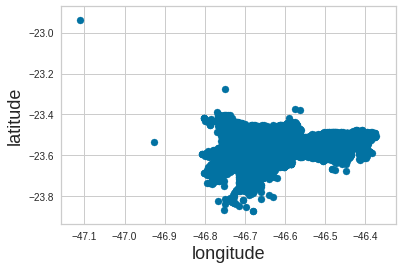

In [10]:
plt.scatter(xrm[:,0], xrm[:,1], cmap='gist_rainbow')
plt.xlabel('longitude', fontsize=18)
plt.ylabel('latitude', fontsize=18)

In [11]:
model = KMeans()
visualizer = KElbowVisualizer(model, k=(1,10),timings=True)
elbow = df10k[['latitude','longitude','cod_grupo_rubrica']]
elbow.head()

,latitude,longitude,cod_grupo_rubrica
188441,-23.500331,-46.622417,3
66237,-23.574244,-46.727104,3
158125,-23.552546,-46.575284,3
56156,-23.528773,-46.734208,3
263160,-23.558428,-46.640432,3


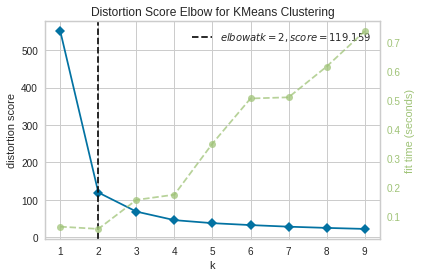

In [12]:
visualizer.fit(elbow) # Fit the data to the visualizer
visualizer.show() # Finalize and render the figure

In [13]:
km = KMeans(n_clusters = visualizer.elbow_value_)
km.fit(xrm)

KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
    n_clusters=2, n_init=10, n_jobs=None, precompute_distances='auto',
    random_state=None, tol=0.0001, verbose=0)

In [14]:
new_labels = km.labels_
new_labels

array([0, 0, 0, ..., 1, 0, 0], dtype=int32)

In [35]:
res =  pd.concat([pd.DataFrame(xrm),pd.DataFrame(new_labels)], axis=1)
len(res.index)

10000

In [37]:
res.columns = ['lat','long','grupo','cluster']
xrm2 = res.values

In [50]:
res['lat'][100]

-46.693424419999999

In [39]:
res.groupby(by=['grupo','cluster']).count()

,,lat,long
grupo,cluster,,
2.0,1,452,452
3.0,0,9548,9548


Text(0.5,1,'Com agrupamento')

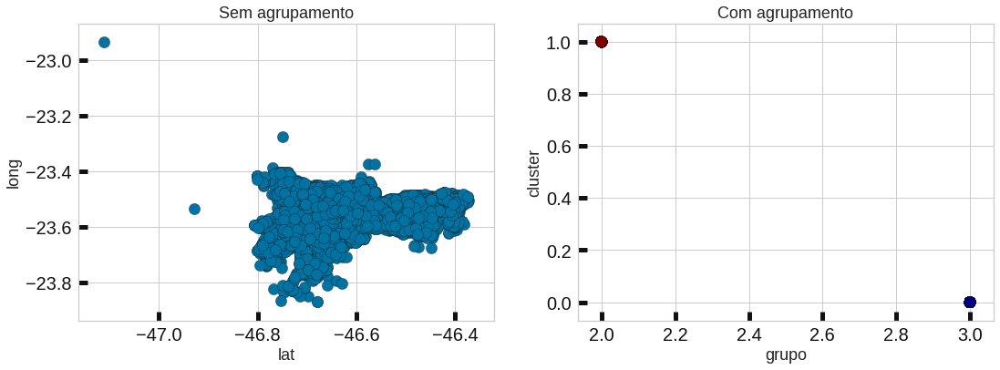

In [19]:
fig, axes = plt.subplots(1, 2, figsize=(18,6))
axes[0].scatter(xrm2[:, 0], xrm2[:, 1], cmap='gist_rainbow',
edgecolor='k', s=150)
axes[1].scatter(xrm2[:, 2], xrm2[:, 3], c=new_labels, cmap='jet',
edgecolor='k', s=150)
axes[0].set_xlabel('lat', fontsize=18)
axes[0].set_ylabel('long', fontsize=18)
axes[1].set_xlabel('grupo', fontsize=18)
axes[1].set_ylabel('cluster', fontsize=18)
axes[0].tick_params(direction='in', length=10, width=5, colors='k', labelsize=20)
axes[1].tick_params(direction='in', length=10, width=5, colors='k', labelsize=20)
axes[0].set_title('Sem agrupamento', fontsize=18)
axes[1].set_title('Com agrupamento', fontsize=18)

,total_bill,tip,sex,smoker,day,time,size
0,16.99,1.01,Female,No,Sun,Dinner,2
1,10.34,1.66,Male,No,Sun,Dinner,3
2,21.01,3.50,Male,No,Sun,Dinner,3
3,23.68,3.31,Male,No,Sun,Dinner,2
4,24.59,3.61,Female,No,Sun,Dinner,4


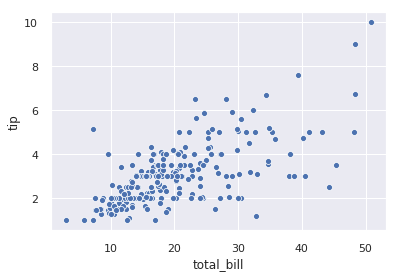

In [163]:
import matplotlib.pyplot as plt
tips = sns.load_dataset("tips")
ax = sns.scatterplot(x="total_bill", y="tip", data=tips)
tips.head()

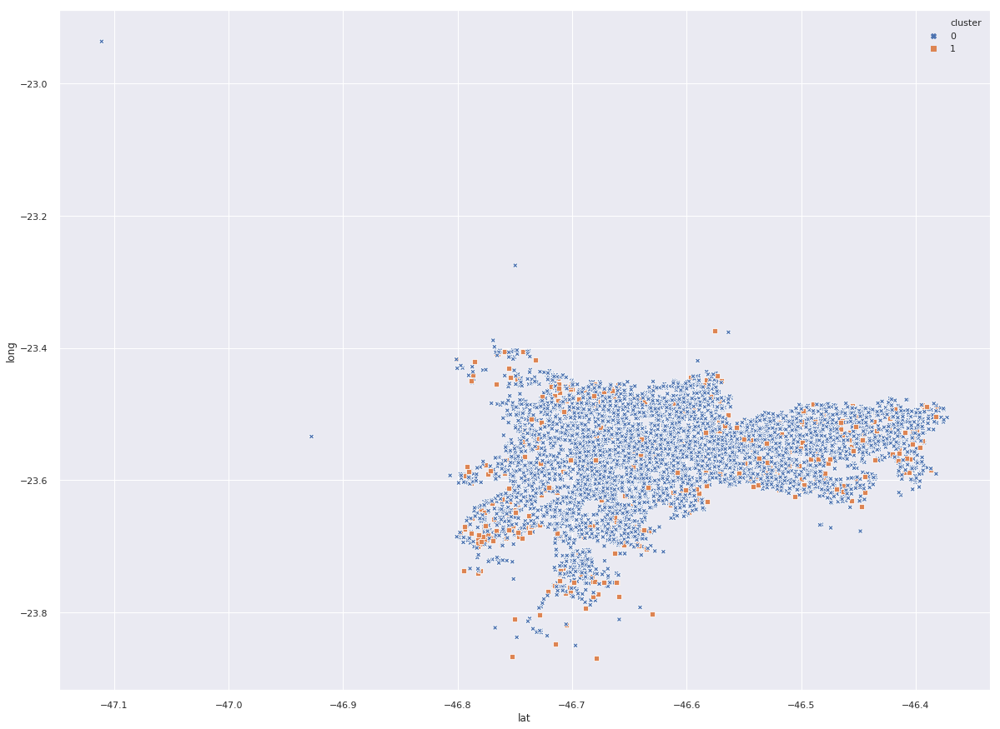

In [40]:
plt.figure(figsize=(20,15))
markers = {0: "X", 1: "s"}
ax = sns.scatterplot(x="lat", y="long", hue='cluster', style='cluster',
                      markers=markers,
                     data=res)

In [53]:
m = folium.Map(location=[-23.550341, -46.622445])

In [54]:
m

In [57]:
#['lat','long','grupo','cluster']
i = 0
cor = ''
popup = ''
tooltip = 'Click for more info'
lat = 0.0
long = 0.0
while ( i < 3):
    if (res['cluster'][i] == 0):
        cor = 'blue'
        popup = '<strong>Furto</strong>'
    else:
        color = 'orange'
        popup = '<strong>Homicidio</strong>'
    folium.Marker([res['lat'][i], res['long'][i]],
                popup= popup,
                tooltip = tooltip).add_to(m)
    i += 1
#end while

In [58]:
m

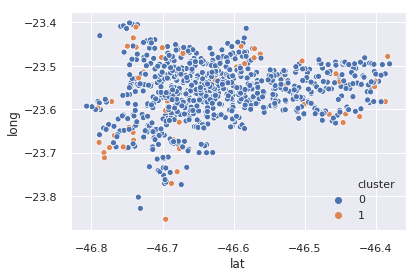

In [164]:
import seaborn as sns; sns.set()
markers = {0: "s", 1: "X"}
ax = sns.scatterplot(x='lat',y='long',hue='cluster',markers=markers,data=res)

In [149]:
fig, axes = plt.figsize=(28,12)
axes[0].scatter(xrm[:, 0], xrm[:, 1], c=new_labels, cmap='jet',
edgecolor='k', s=150)
axes[0].set_xlabel('latitude', fontsize=18)
axes[0].set_ylabel('longitude', fontsize=18)
axes[0].tick_params(direction='in', length=10, width=5, colors='k', labelsize=20)
axes[0].set_title('Com agrupamento', fontsize=18)


TypeError: 'int' object is not subscriptable

Text(0.5,1,'Com agrupamento')

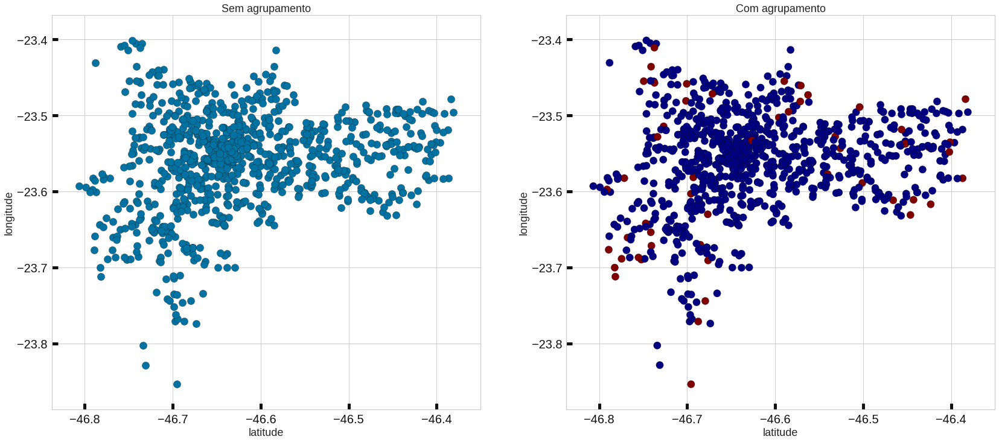

In [146]:
fig, axes = plt.subplots(1, 2, figsize=(28,12))
axes[0].scatter(xrm[:, 0], xrm[:, 1], cmap='gist_rainbow',
edgecolor='k', s=150)
axes[1].scatter(xrm[:, 0], xrm[:, 1], c=new_labels, cmap='jet',
edgecolor='k', s=150)
axes[0].set_xlabel('latitude', fontsize=18)
axes[0].set_ylabel('longitude', fontsize=18)
axes[1].set_xlabel('latitude', fontsize=18)
axes[1].set_ylabel('longitude', fontsize=18)
axes[0].tick_params(direction='in', length=10, width=5, colors='k', labelsize=20)
axes[1].tick_params(direction='in', length=10, width=5, colors='k', labelsize=20)
axes[0].set_title('Sem agrupamento', fontsize=18)
axes[1].set_title('Com agrupamento', fontsize=18)


Text(0.5,1,'Com agrupamento')

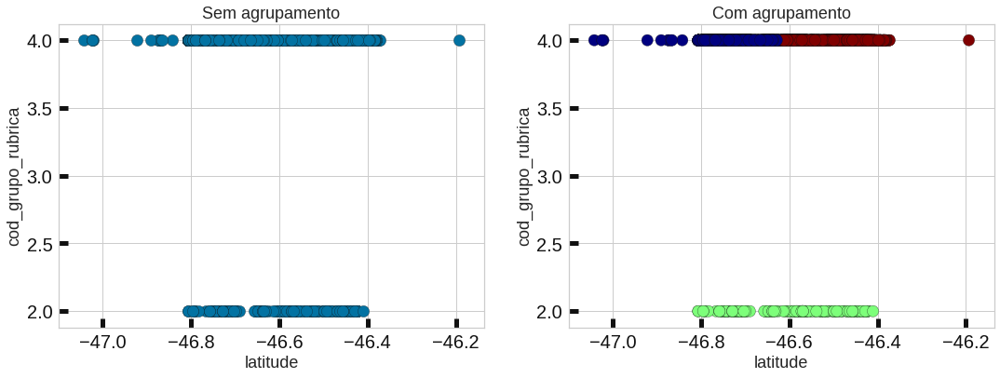

In [70]:
fig, axes = plt.subplots(1, 2, figsize=(18,6))
axes[0].scatter(xrm[:, 0], xrm[:, 2], cmap='gist_rainbow',
edgecolor='k', s=150)
axes[1].scatter(xrm[:, 0], xrm[:, 2], c=new_labels, cmap='jet',
edgecolor='k', s=150)
axes[0].set_xlabel('latitude', fontsize=18)
axes[0].set_ylabel('cod_grupo_rubrica', fontsize=18)
axes[1].set_xlabel('latitude', fontsize=18)
axes[1].set_ylabel('cod_grupo_rubrica', fontsize=18)
axes[0].tick_params(direction='in', length=10, width=5, colors='k', labelsize=20)
axes[1].tick_params(direction='in', length=10, width=5, colors='k', labelsize=20)
axes[0].set_title('Sem agrupamento', fontsize=18)
axes[1].set_title('Com agrupamento', fontsize=18)

In [71]:
xrm.head()

AttributeError: 'numpy.ndarray' object has no attribute 'head'

In [95]:
from sklearn import metrics
from sklearn.metrics import pairwise_distances
import numpy as np

In [97]:
metrics.silhouette_score(xrm,new_labels,metric = 'euclidean')

0.44490678105366327

In [93]:
dim_rubrica =  pd.read_sql_query("""select * 
                            from dim_rubrica""",conn)